# 2 - Stereo Vision

John Wu - #260612056

Use a stereo image-pair of your choice from the Middlebury dataset: http: //vision.middlebury.edu/stereo/data/ for the following questions. The dataset provides depth images in .pfm format. A function to read such ﬁle in provided along with this assignment.

## 2.2 - Epipolar Geometry

#### Compute matching SIFT keypoints from a stereo image pair.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

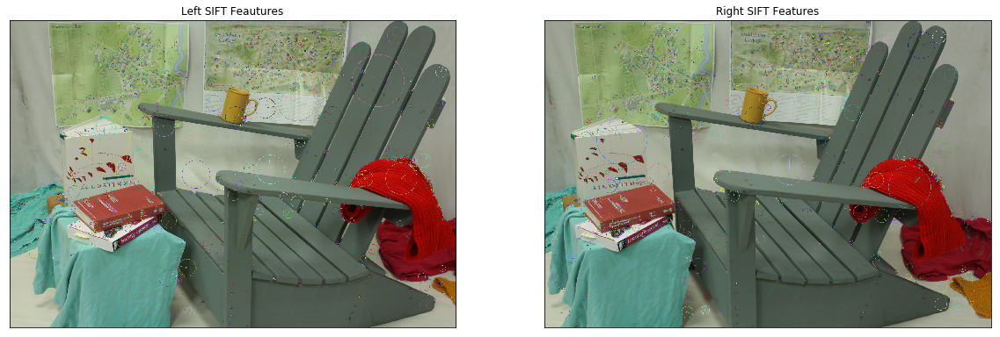

In [2]:
# load left and right images
image_left = cv2.imread("im0.png", cv2.IMREAD_COLOR)
image_right = cv2.imread("im1.png", cv2.IMREAD_COLOR)

image_left = cv2.cvtColor(image_left, cv2.COLOR_BGR2RGB)
image_right = cv2.cvtColor(image_right, cv2.COLOR_BGR2RGB)

# compute sift
sift = cv2.xfeatures2d.SIFT_create()

# find keypoints and descriptors with SIFT
keypoints_left, descriptors_left = sift.detectAndCompute(image_left, None)
keypoints_right, descriptors_right = sift.detectAndCompute(image_right, None)

# draw keypoints
display_left = image_left.copy()
display_right = image_right.copy()
cv2.drawKeypoints(image_left, keypoints_left, display_left, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(image_right, keypoints_right, display_right, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display sift results
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(display_left)
plt.title("Left SIFT Feautures"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(display_right)
plt.title("Right SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

Given distance ratio max threshold of 0.2, 493 good matches were found.
Given distance ratio max threshold of 0.2, 1625 bad matches were found.


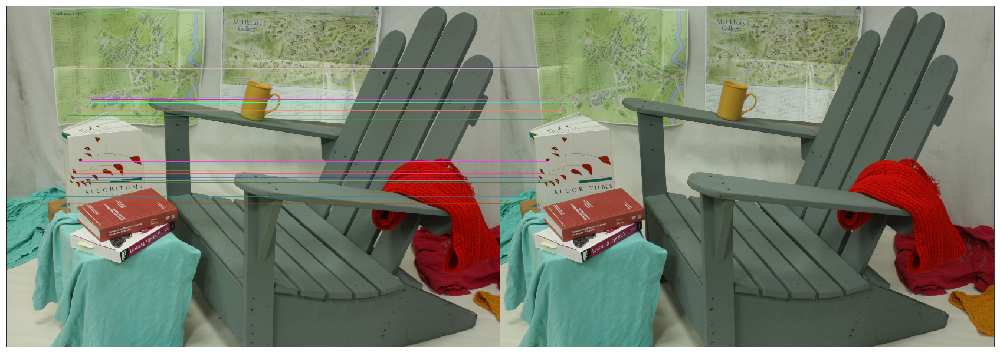

In [3]:
# match descriptors
matches = cv2.BFMatcher().knnMatch(descriptors_left, descriptors_right, k=2)

# store good and bad points given a ratio
ratio = 0.20
good_points, good_left, good_right = [], [], []
bad_points, bad_left, bad_right = [], [], []

for i, (m, n) in enumerate(matches):
    if m.distance < ratio * n.distance:
        good_points.append(m)
        good_right.append(keypoints_right[m.trainIdx].pt)
        good_left.append(keypoints_left[m.queryIdx].pt)
    if m.distance > (1-ratio) * n.distance:
        bad_points.append(m)
        bad_right.append(keypoints_right[m.trainIdx].pt)
        bad_left.append(keypoints_left[m.queryIdx].pt)
        
# output matching data        
print("Given distance ratio max threshold of {}, {} good matches were found.".format(ratio, len(good_points)))
print("Given distance ratio max threshold of {}, {} bad matches were found.".format(ratio, len(bad_points)))
        
# draw feature point matching
image_matches = cv2.drawMatches(image_left.copy(), keypoints_left, image_right.copy(), keypoints_right, good_points[:40], image_left.copy(), flags=2)
plt.figure(figsize=(30,30))
plt.imshow(image_matches)
plt.xticks([]), plt.yticks([])
plt.show()

#### Compute and display the epipolar lines for both images.

In [4]:
''' Draws the epilines corresponding to points in images'''
def draw_lines(imageA, imageB, lines, pointsA, pointsB):
    r, c, _ = imageA.shape
    for r, ptA, ptB in zip(lines, pointsA, pointsB):
        # pick a random color
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        # draw the lines and the points
        imageA = cv2.line(imageA, (x0,y0), (x1,y1), color, 1)
        imageA = cv2.circle(imageA, tuple(ptA), 5, color, -1)
        imageB = cv2.circle(imageB, tuple(ptB), 5, color, -1)
    return imageA, imageB

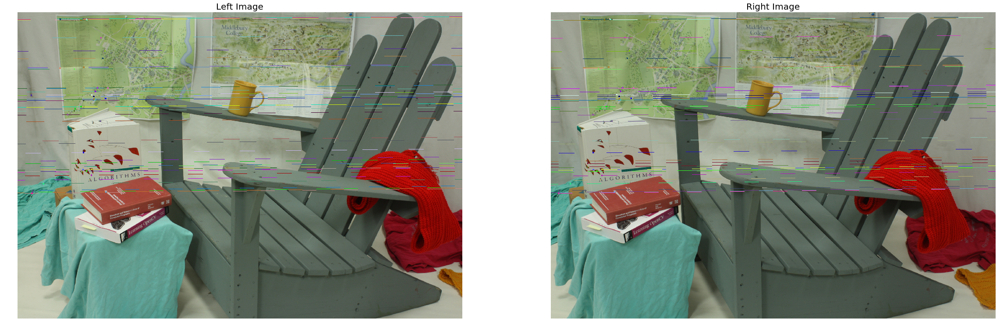

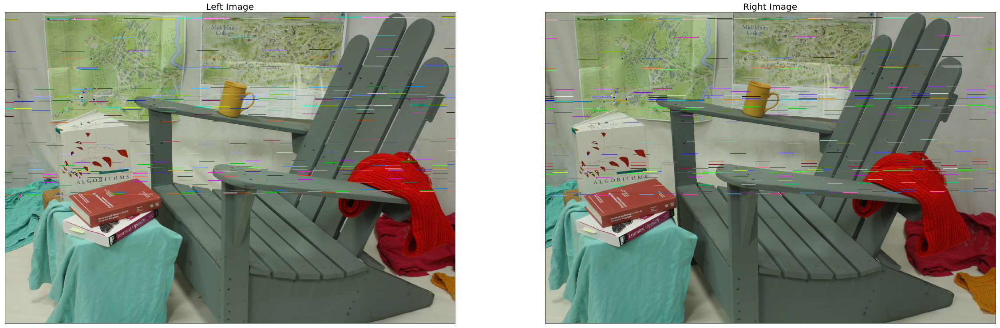

In [5]:
# use first few points for computing fundamental matrix
num_points = 50
good_points = good_points[:num_points]
good_left = good_left[:num_points]
good_right = good_right[:num_points]

# compute fundamental matrix
good_left = np.int32(good_left)
good_right = np.int32(good_right)
F, _ = cv2.findFundamentalMat(good_left, good_right, cv2.FM_LMEDS)

# draw the epilines
lines_left = cv2.computeCorrespondEpilines(good_right, 2, F)
lines_left = lines_left.reshape(-1, 3)
image_l1, image_r1 = draw_lines(image_left, image_right, lines_left, good_left, good_right)

lines_right = cv2.computeCorrespondEpilines(good_left, 2, F)
lines_right = lines_right.reshape(-1, 3)
image_r2, image_l2 = draw_lines(image_right, image_left, lines_right, good_right, good_left)

# display images
plt.figure(figsize=(40,40))
plt.subplot(121), plt.imshow(image_l1)
plt.title("Left Image",fontsize=20), plt.axis('off')
plt.subplot(122), plt.imshow(image_r1)
plt.title("Right Image",fontsize=20), plt.axis('off')
plt.figure(figsize=(40,40))
plt.subplot(121), plt.imshow(image_l2)
plt.title("Left Image",fontsize=20), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image_r2)
plt.title("Right Image",fontsize=20), plt.xticks([]), plt.yticks([])
plt.show()

#### Pick any one keypoint in the right image which doesn’t have a correct match in the left image, and is not on the corresponding epipolar line. Extract a patch of size (5 × 5) around this keypoint in the right image. 

In [6]:
''' Extracts a patch from feature point on the image '''
def extract_patch(image, keypoint, size=5):
    x_center = keypoint[0]
    y_center = keypoint[1]
    offset_start = int(size/2)
    offset_end = int(size/2) + 1
    x_start, x_end = int(x_center-offset_start), int(x_center+offset_end)
    y_start, y_end = int(y_center-offset_start), int(y_center+offset_end)
    return image[y_start:y_end, x_start:x_end]

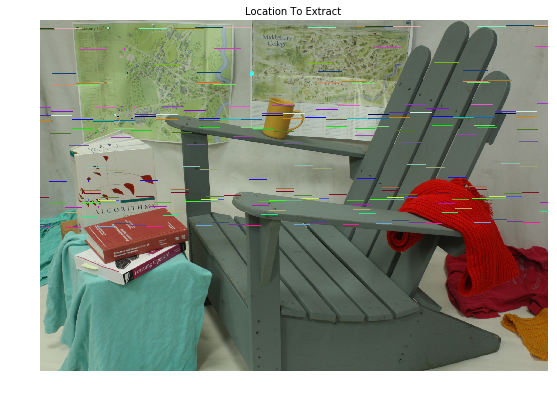

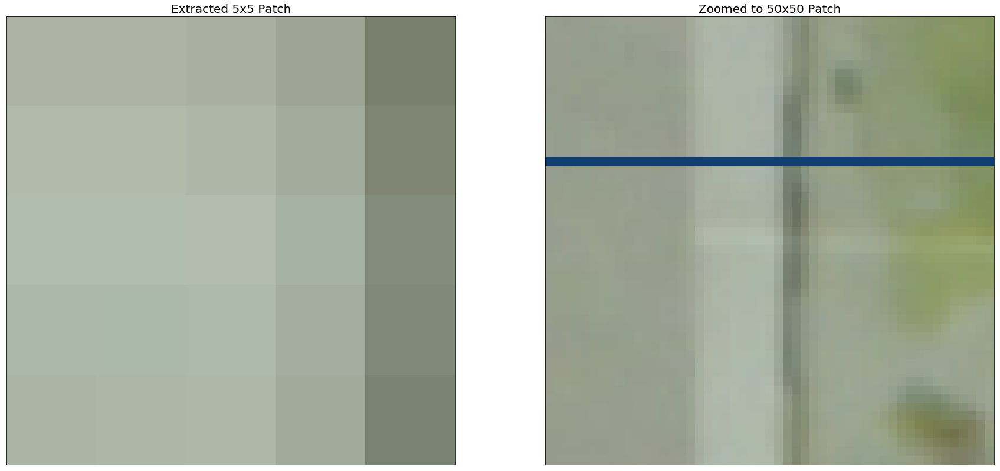

In [7]:
# point to use
point = bad_right[0]

# draw circle on image
patch_location = image_right.copy()
patch_location = cv2.circle(patch_location, tuple([int(point[0]), int(point[1])]), 13, (66, 244, 238), -1)

# extract patch around keypoint
patch_extracted = extract_patch(image_right, point)

# zoom out for better display
display_extracted = extract_patch(image_right, point, size=50)

# display location
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(patch_location)
plt.title("Location To Extract", fontsize=10)
plt.axis('off')
plt.show()

# display patch
plt.figure(figsize=(30,30))
plt.subplot(121), plt.imshow(patch_extracted)
plt.title("Extracted 5x5 Patch", fontsize=20), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(display_extracted)
plt.title("Zoomed to 50x50 Patch", fontsize=20) 
plt.xticks([]), plt.yticks([])
plt.show()

#### Match the extracted patch using the sum of squared diﬀerence (SSD) with every patch along the corresponding epipolar line in the left image.

In [8]:
''' Returns the list of image patches on a given coordinate '''
def compute_patches(keypoint, image, size=5):
    row = keypoint[1]
    offset_start = int(size/2)
    offset_end = int(size/2) + 1
    patches = []
    for i in range(offset_start, image.shape[1] - offset_end):
        patch = image[int(row-offset_start): int(row+offset_end), int(i-offset_start): int(i+offset_end)]
        patches.append(patch)
    
    return patches

In [9]:
''' Computes the SSD between the list of patches on epipolar line and the extracted patch '''
def compute_SSD(patches, extracted, display=True):
    result = []
    for i in range(len(patches)):
        res = np.sum((extracted[:,:,0:3]-patches[i][:,:,0:3])**2)
        result.append(res)    
    idx_min = result.index(min(result))
    
    # display result
    if display:
        plt.figure(figsize=(15,15))
        plt.subplot(121), plt.imshow(extracted)
        plt.title("Extracted patch"), plt.axis('off')
        plt.subplot(122), plt.imshow(patches[idx_min])
        plt.title("Corresponding patch on left image with lowest SSD."), plt.axis('off')
        
    return result

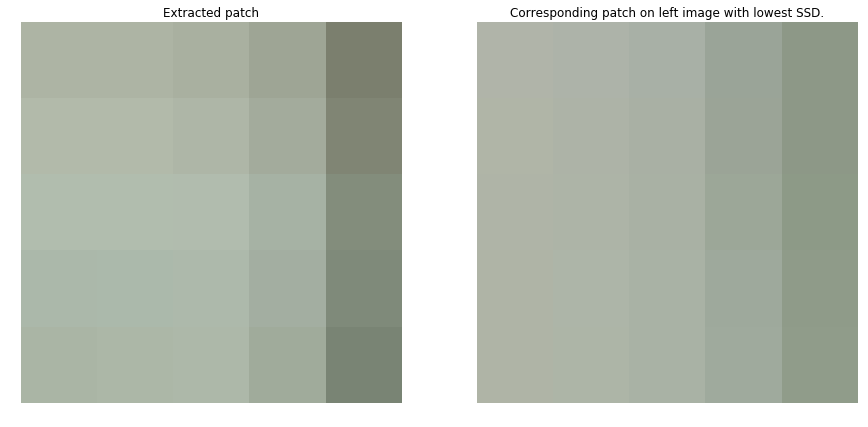

In [17]:
# extract patches from the left image
patches_left = compute_patches(bad_right[0], image_left)

# compute SSD between extracted patches
ssd = compute_SSD(patches_left, patch_extracted)

Zoomed out for cross validation check.


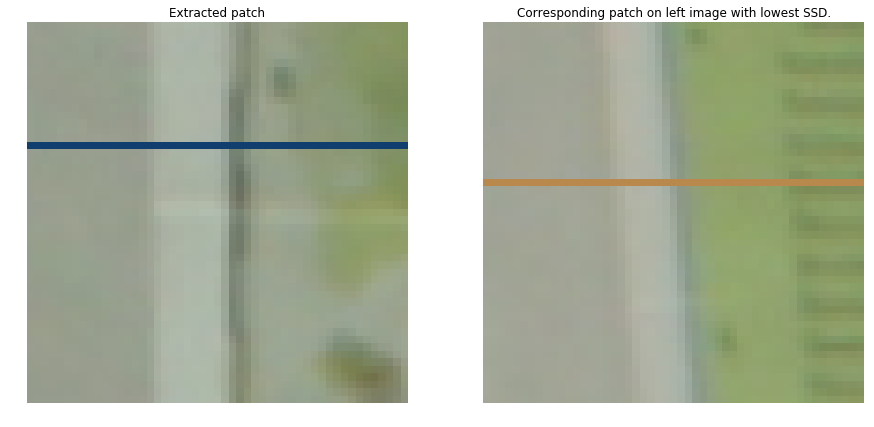

In [18]:
# repeat on zoomed out image for validation
print('Zoomed out for cross validation check.')
display_patches = compute_patches(bad_right[0], image_left, size=50)
display_ssd = compute_SSD(display_patches, display_extracted)

#### Plot SSD values (refer Lecture 14 slide 5). Find the matching point with minimum SSD value. Display found matching points in both the images. 

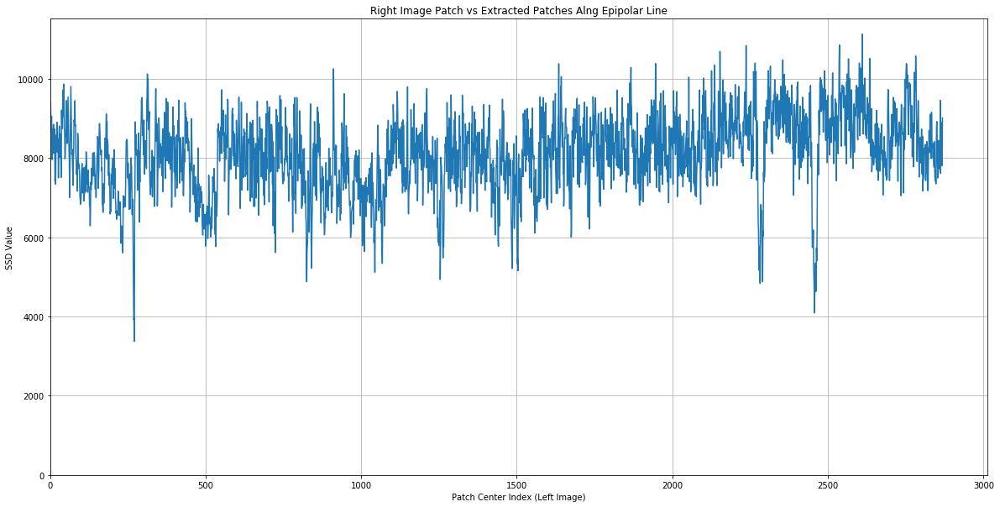

In [19]:
plt.figure(figsize=(20,10))
plt.title("Right Image Patch vs Extracted Patches Alng Epipolar Line")
plt.xlabel("Patch Center Index (Left Image)")
plt.ylabel("SSD Value")
plt.plot(range(2, len(image_left[0]) - 3), ssd)
plt.ylim(ymin=0)
plt.xlim(xmin=0)
plt.grid(True)
plt.show()

#### Did you ﬁnd exactly one matching point with lowest SSD or multiple? Is the found matching point correct one? Explain why.

A unique matching point with the lowest SSD was found. However, it does not seem to be the correct one. The reason for this is that a point on the left edge of the map was trying to be matched, but the map beside it had an identical border which it matched the point to by mistake. This created a symmetry effect which ultimately made the lowest SSD method not effective.

#### Suppose you found multiple matches in the previous question. What constraint(s) could be imposed on the matching algorithm to ﬁnd a single match.

A possible constraint would be to impose the same ordering of corresponding points in both views (the condition would hold if disparity gradient < 2). You could use other cost equtions in order to break ties, or combine the lowest SSD with other cost functions in general to determine the best match. As an example, a smoothness cost term could be added to the total match cost. Smoothness constraints would ensure disparity within a local neighbourhood of pixels are smoothly varying.

#### Suppose you found exactly one match with the lowest SSD, but it is incorrect one. What constraint(s) could be imposed to ﬁnd a correct match? 

If we found the wrong match, then we would need to decide on a better match cost function just like in the case above. There are many different factors that may effect the ground truth result (such smoothness, depth, or disparity continuities), so experimenting with each one to determine which factor would have the highest weighting on best accuracy at predicting the result would be needed in order to create the best cost function.